# Benchmarking scib simulation 2 results 

Data were first generated with R_scib_sim2.ipynb

In [54]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [55]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [56]:
proj_name = "scib_sim2_benchmarking"
save_dir = f"./save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)


cpu


In [57]:
data_dir = Path("../data/simulate_batch_scib/")
adata = sc.read(
    data_dir / "sim2_qc.h5ad"
)
show_cols = ['Batch', 'Group', 'total']
file_suffix = f"{time.strftime('%b%d-%H%M')}"

In [58]:
adata

AnnData object with n_obs × n_vars = 19318 × 10000
    obs: 'Cell', 'Batch', 'Group', 'ExpLibSize', 'SubBatch', 'Sub', 'sum', 'detected', 'total', 'Discard', 'sizeFactor'
    var: 'Gene', 'BaseGeneMean', 'OutlierFactor', 'GeneMean', 'BatchFacBatch1', 'BatchFacBatch2', 'BatchFacBatch3', 'BatchFacBatch4', 'DEFacGroup1', 'DEFacGroup2', 'DEFacGroup3', 'DEFacGroup4', 'mean', 'detected'

In [59]:
feature_list = ccd.ul.select_features(adata, n_top_features=3000, flavor='seurat_v3', normalize=False, log1p=False)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata = adata[:, feature_list]
adata.obs['log_ncounts'] = np.log1p(adata.obs['total'])

In [60]:
import seaborn as sns
import pandas as pd
adata_ds = adata.copy()[np.random.choice(adata.n_obs, 1000, replace=False), :]

In [12]:
adata_ds.X.A[0:20,0:20]

array([[0.        , 0.        , 2.18631663, 0.        , 0.        ,
        2.10650229, 0.25671764, 2.19721591, 0.09308956, 0.3972986 ,
        2.59451735, 0.25671764, 0.09308956, 0.25671764, 0.09308956,
        0.25671764, 0.17824664, 0.4608116 , 0.        , 0.17824664],
       [0.51051915, 0.        , 2.01423886, 0.        , 0.        ,
        2.19654339, 0.15404123, 2.39719859, 0.        , 0.60578753,
        2.33468273, 0.        , 0.        , 0.15404123, 0.        ,
        0.15404123, 0.        , 0.28749053, 0.28749053, 0.51051915],
       [0.2862174 , 0.        , 1.85826019, 0.        , 0.        ,
        1.87533915, 0.        , 2.17959272, 0.50848111, 0.4397397 ,
        2.33007303, 0.19960569, 0.19960569, 0.2862174 , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.2862174 ],
       [0.13427029, 0.06938702, 2.37023239, 0.195199  , 0.        ,
        1.72249173, 0.13427029, 2.31501462, 0.195199  , 0.89077559,
        2.71355414, 0.13427029, 0.        , 0

In [61]:
adata_ds_scaled = sc.pp.scale(adata_ds, copy=True)

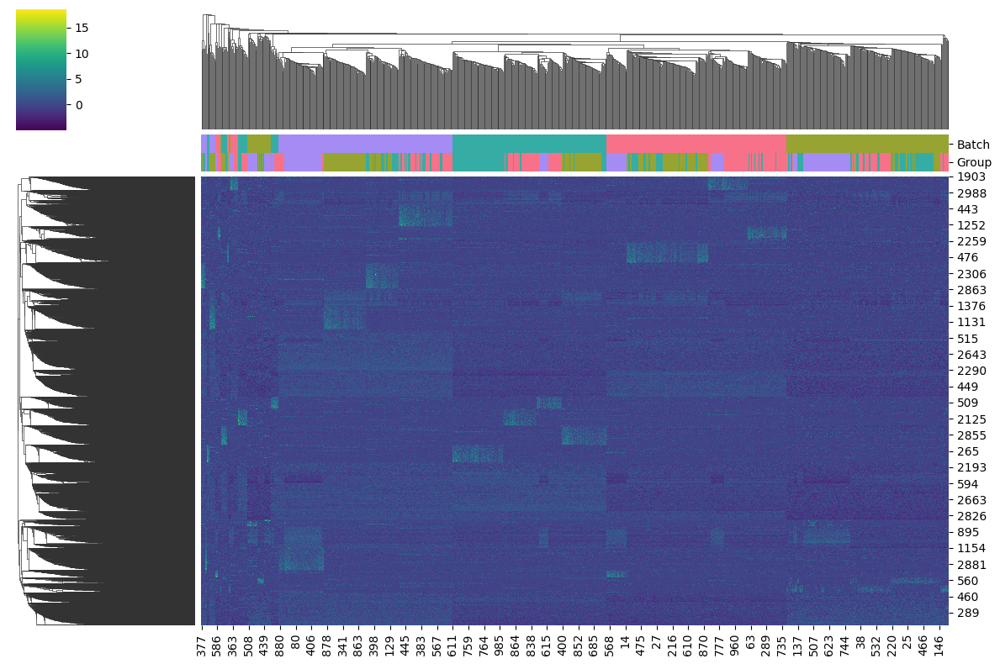

In [62]:
ccd.pl.clustermap_with_annotations(adata_ds_scaled, key='X', obs_keys=['Batch', 'Group']) 

## No correction

In [63]:
sc.pp.pca(adata, n_comps=30)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=30)
sc.tl.umap(adata, min_dist=0.1)

In [64]:
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

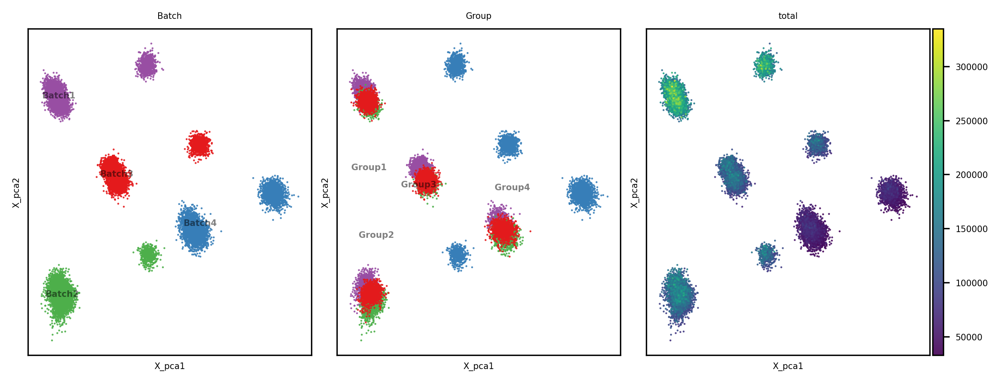

In [65]:
show_basis = 'X_pca'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=5, legend_loc='on data',
    save_path=save_dir / f"embeddings_{show_basis}_{file_suffix}.png"
)

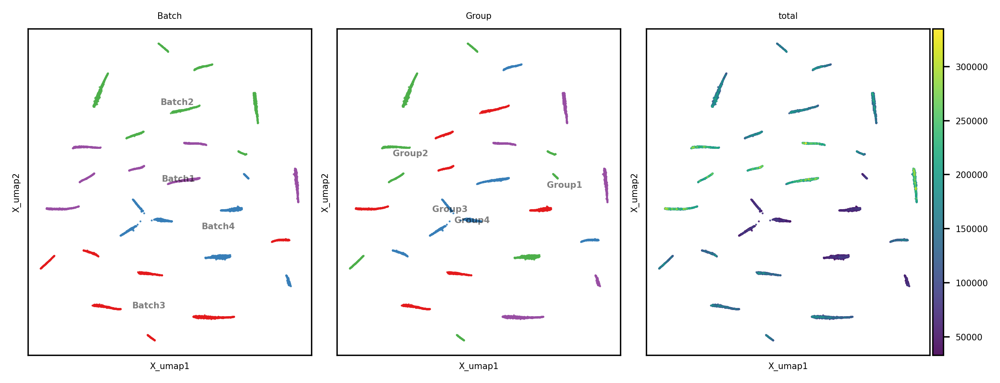

In [20]:
show_basis = 'X_umap'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=5, legend_loc='on data',
    save_path=save_dir / f"embeddings_{show_basis}_{file_suffix}.png"
)

In [80]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      n_epochs=5,
                      latent_dim=10, # latent dimension
                      encoder_dims = [50,10,5], # encoder architecture
                      decoder_dims = [30], # decoder architecture
                      norm_type = 'layer_norm',
                      domain_key='Batch', # key indicating batch
                      augmentation_mask_prob = 0.2, # augmentation mask probability, recommend between 0.1 and 0.7
                      clr_temperature = 0.5, # temperature for NT-Xent loss
                      seed=seed, # random seed
                      p_intra_domain = 1.0, # probability of intra-domain sampling
                      p_intra_knn=0.0,
                      verbose=False, # print training progress
                      inplace=True, # whether to modify original adata, set to False if you want to keep all expressions
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
file_suffix = f"{proj_name}_{time.strftime('%b%d-%H%M')}"
output_key = 'Concord'
cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.


Epoch 0 Training: 300it [00:04, 62.75it/s, loss=4.97]
Epoch 4 Training: 100%|██████████| 300/300 [00:04<00:00, 67.17it/s, loss=4.91]


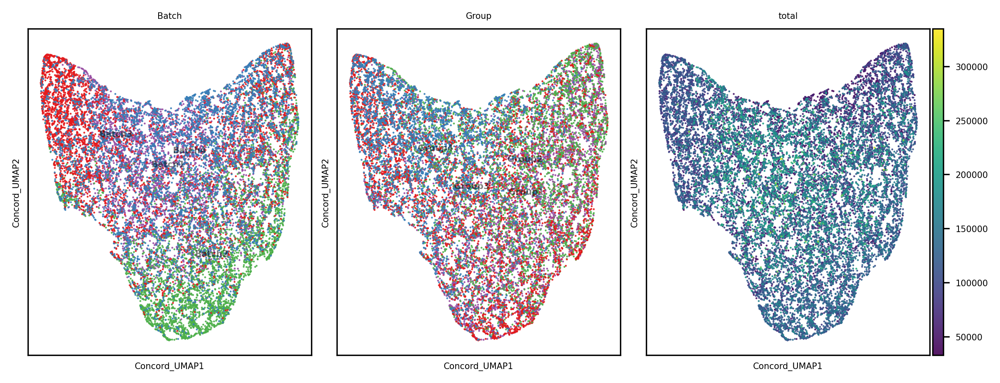

In [81]:
ccd.ul.run_umap(adata, source_key=output_key, umap_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
output_key = 'Concord'
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,3), dpi=300, ncols=3, font_size=5, point_size=5, legend_loc='on data',
    save_path=save_dir / f"embeddings_{show_basis}_{file_suffix}.png"
)

In [70]:
import plotly.io as pio
pio.renderers.default = 'notebook'
ccd.ul.run_umap(adata,  source_key=output_key, umap_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=15, min_dist=0.1, metric='euclidean')


In [71]:
# Plot the 3D UMAP embeddings
col = 'Batch'
show_basis = f'{output_key}_UMAP_3D'
ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

In [53]:
# Plot the 3D UMAP embeddings
col = 'Group'
show_basis = f'{output_key}_UMAP_3D'
ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )